In [ ]:
# prompt: pathlib から Path , pandas, geopandas, tqdm をインポートしてください

from pathlib import Path
import pandas as pd
import geopandas as gpd
from tqdm import tqdm


In [ ]:
# prompt: ドライブを接続してください

from google.colab import drive
drive.mount('/content/drive')


MessageError: Error: credential propagation was unsuccessful

In [ ]:
# prompt: /content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh ディレクトリの下にあるディレクトリを調べてください。

import os

# Get the path to the directory
data_dir = Path('/content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh')

# List all subdirectories
subdirectories = [d for d in os.listdir(data_dir) if os.path.isdir(data_dir / d)]

# Print the subdirectories
print(subdirectories)


['stats', 'position', 'teigisho']


In [ ]:
# prompt: positionには複数のzip file に位置情報が含まれるデータが格納されています。複数のzip のpathを取得して、geopandasで読み込み、マージしてください

import pandas as pd
# Get the paths of all zip files in the subdirectories
zip_paths = []
for subdirectory in subdirectories:
  subdirectory_path = data_dir / subdirectory
  for file in os.listdir(subdirectory_path):
    if file.endswith('.zip'):
      zip_paths.append(subdirectory_path / file)

# Read the zip files into GeoDataFrames
gdfs = []
for zip_path in tqdm(zip_paths):
  gdf = gpd.read_file(zip_path)
  gdfs.append(gdf)

# Merge the GeoDataFrames
merged_gdf = pd.concat(gdfs)

# Print the merged GeoDataFrame
print(merged_gdf)


100%|██████████| 18/18 [00:32<00:00,  1.80s/it]

      KEY_CODE MESH1_ID MESH2_ID MESH3_ID  OBJ_ID  \
0     40280000     4028       00       00       1   
1     40280001     4028       00       01       2   
2     40280002     4028       00       02       3   
3     40280003     4028       00       03       4   
4     40280004     4028       00       04       5   
...        ...      ...      ...      ...     ...   
6295  48307795     4830       77       95    6296   
6296  48307796     4830       77       96    6297   
6297  48307797     4830       77       97    6298   
6298  48307798     4830       77       98    6299   
6299  48307799     4830       77       99    6300   

                                               geometry  
0     POLYGON ((128.01250 26.66667, 128.00000 26.666...  
1     POLYGON ((128.02500 26.66667, 128.01250 26.666...  
2     POLYGON ((128.03750 26.66667, 128.02500 26.666...  
3     POLYGON ((128.05000 26.66667, 128.03750 26.666...  
4     POLYGON ((128.06250 26.66667, 128.05000 26.666...  
...            

<Axes: >

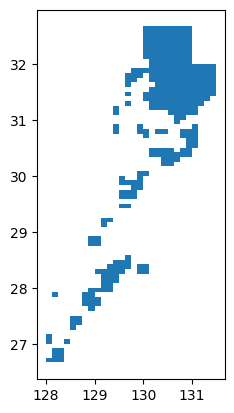

In [ ]:
# prompt: 変数 merged_gdf を plot してください

merged_gdf.plot()


In [ ]:
# prompt: /content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh ディレクトリの下にあるstatsの下には 2020年のデータと 1995年のデータがそれぞれのディレクトリにzip file で格納されています。それぞれの年のデータを pandas で読み込んでください。

import pandas as pd
# Get the paths to the 2020 and 1995 data directories
data_2020_dir = data_dir / 'stats' / '2020'
data_1995_dir = data_dir / 'stats' / '1995'

# Get the paths of all zip files in the 2020 and 1995 data directories
zip_paths_2020 = [data_2020_dir / file for file in os.listdir(data_2020_dir) if file.endswith('.zip')]
zip_paths_1995 = [data_1995_dir / file for file in os.listdir(data_1995_dir) if file.endswith('.zip')]

# Read the zip files into GeoDataFrames
gdfs_2020 = []
gdfs_1995 = []
for zip_path in tqdm(zip_paths_2020):
  gdf = gpd.read_file(zip_path)
  gdfs_2020.append(gdf)
for zip_path in tqdm(zip_paths_1995):
  gdf = gpd.read_file(zip_path)
  gdfs_1995.append(gdf)

# Merge the GeoDataFrames
merged_gdf_2020 = pd.concat(gdfs_2020)
merged_gdf_1995 = pd.concat(gdfs_1995)

# Print the merged GeoDataFrames
print(merged_gdf_2020)
print(merged_gdf_1995)


  0%|          | 0/16 [00:00<?, ?it/s]


DriverError: '/vsizip//content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh/stats/2020/tblT001100S4028.zip' not recognized as a supported file format.

In [ ]:
# prompt: /content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh ディレクトリの下にあるstatsの下には 2020年のデータと 1995年のデータがそれぞれのディレクトリにzip file で格納されています。それぞれの年のデータを pandas で読み込んでください。headerは0, 1行目を指定してください, encodingはcp932です

import pandas as pd
# Get the paths to the 2020 and 1995 data directories
data_2020_dir = data_dir / 'stats' / '2020'
data_1995_dir = data_dir / 'stats' / '1995'

# Get the paths of all zip files in the 2020 and 1995 data directories
zip_paths_2020 = [data_2020_dir / file for file in os.listdir(data_2020_dir) if file.endswith('.zip')]
zip_paths_1995 = [data_1995_dir / file for file in os.listdir(data_1995_dir) if file.endswith('.zip')]

# Read the zip files into GeoDataFrames for 2020 and 1995
gdfs_2020 = []
for zip_path in tqdm(zip_paths_2020):
  gdf = pd.read_csv(zip_path, header=[0, 1], encoding='cp932')
  gdfs_2020.append(gdf)

gdfs_1995 = []
for zip_path in tqdm(zip_paths_1995):
  gdf = pd.read_csv(zip_path, header=[0, 1], encoding='cp932')
  gdfs_1995.append(gdf)

# Merge the GeoDataFrames for 2020 and 1995
merged_gdf_2020 = pd.concat(gdfs_2020)
merged_gdf_1995 = pd.concat(gdfs_1995)

# Print the merged GeoDataFrames for 2020 and 1995
print(merged_gdf_2020)
print(merged_gdf_1995)


100%|██████████| 16/16 [00:10<00:00,  1.54it/s]

               KEY_CODE           HTKSYORI            HTKSAKI  \
     Unnamed: 0_level_1 Unnamed: 1_level_1 Unnamed: 2_level_1   
0              40280000                  0                NaN   
1              40280001                  0                NaN   
2              40280008                  0                NaN   
3              40280009                  0                NaN   
4              40280010                  0                NaN   
...                 ...                ...                ...   
3193           47307795                  0                NaN   
3194           47307796                  0                NaN   
3195           47307797                  0                NaN   
3196           47307798                  0                NaN   
3197           47307799                  0                NaN   

                 GASSAN T001100001 T001100002 T001100003  T001100004  \
     Unnamed: 3_level_1    　人口（総数）  　人口（総数）　男  　人口（総数）　女 　０～１４歳人口　総数   
0         

上はコードの修正が必要だった

人口の比較をしたい

その前に、カラムをシングルカラムに作り直す
人間が見てもわかりやすいように


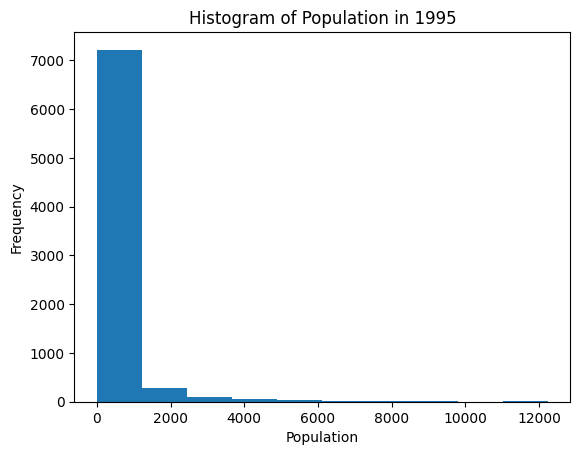

In [ ]:
# prompt: 1995年のデータの人口総数のヒストグラムを作成してください。データはマルチカラムになっており、T000751001, 人口総数のラベルです

import matplotlib.pyplot as plt

# Extract the population column
population_column = merged_gdf_1995['T000751001', '人口総数']

# Create a histogram
plt.hist(population_column, bins=10)
plt.xlabel('Population')
plt.ylabel('Frequency')
plt.title('Histogram of Population in 1995')
plt.show()


In [ ]:
merged_gdf_1995['T000751001', '人口総数']

0       289
1       307
2       627
3       266
4        72
       ... 
2297     62
2298    126
2299    145
2300    210
2301    152
Name: (T000751001, 人口総数), Length: 7737, dtype: int64

- 人間の指示力の限界もある

In [ ]:
# シングルカラムにするコード

def to_single_column(df):
    col1 = [col for col in df.columns.get_level_values(0) if not col.startswith('T00')]
    col2 = [col.replace('　', '') for col in df.columns.get_level_values(1) if not col.startswith('Unnamed')]
    col = col1 + col2

    df.columns = col
    return df

In [ ]:
merged_gdf_1995 = to_single_column(merged_gdf_1995)

In [ ]:
merged_gdf_2020 = to_single_column(merged_gdf_2020)

In [ ]:
merged_gdf_2020

,KEY_CODE,HTKSYORI,HTKSAKI,GASSAN,人口（総数）,人口（総数）男,人口（総数）女,０～１４歳人口総数,０～１４歳人口男,０～１４歳人口女,...,６人世帯数一般世帯数,７人以上世帯数一般世帯数,親族のみの世帯数一般世帯数,核家族世帯数一般世帯数,核家族以外の世帯数一般世帯数,６歳未満世帯員のいる世帯数一般世帯数,６５歳以上世帯員のいる世帯数一般世帯数,世帯主の年齢が２０～２９歳の１人世帯数一般世帯数,高齢単身世帯数一般世帯数,高齢夫婦世帯数一般世帯数
0,40280000,0,NaN,NaN,204,95,109,20,11,9,...,0,0,59,47,12,5,58,3,28,10
1,40280001,0,NaN,NaN,301,153,148,29,12,17,...,2,0,82,69,13,7,78,2,27,22
2,40280008,0,NaN,NaN,421,219,202,50,29,21,...,3,1,113,91,22,14,119,4,46,22
3,40280009,0,NaN,NaN,141,74,67,4,2,2,...,0,0,39,36,3,1,41,0,18,7
4,40280010,0,NaN,NaN,48,27,21,5,1,4,...,0,0,17,16,1,1,17,0,5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,47307795,0,NaN,NaN,189,90,99,19,12,7,...,1,0,54,44,10,4,48,2,17,15
3194,47307796,0,NaN,NaN,801,424,377,105,56,49,...,2,2,228,217,11,33,150,19,51,50
3195,47307797,0,NaN,NaN,2120,964,1156,302,143,159,...,5,4,606,570,36,86,471,49,174,176
3196,47307798,0,NaN,NaN,2625,1202,1423,317,165,152,...,10,4,725,682,43,74,637,47,275,198


In [ ]:
# prompt: merged_gdf_2020のカラムを KEY_CODE と 人口（総数）で始まるものだけにしたdf2020を作成してください

import pandas as pd

# Extract the columns that start with 'KEY_CODE' and '人口（総数）'
df2020 = merged_gdf_2020[['KEY_CODE'] + [col for col in merged_gdf_2020.columns if col.startswith('人口（総数）')]]

# Print the resulting DataFrame
print(df2020)


      KEY_CODE  人口（総数）  人口（総数）男  人口（総数）女
0     40280000     204       95      109
1     40280001     301      153      148
2     40280008     421      219      202
3     40280009     141       74       67
4     40280010      48       27       21
...        ...     ...      ...      ...
3193  47307795     189       90       99
3194  47307796     801      424      377
3195  47307797    2120      964     1156
3196  47307798    2625     1202     1423
3197  47307799    1748      860      888

[9495 rows x 4 columns]


In [ ]:
# prompt: merged_df_1995とdf2020をKEY_CODEをキーにしてマージして merged という変数に渡してください

import pandas as pd
merged = pd.merge(merged_gdf_1995, df2020, on='KEY_CODE')


In [ ]:
merged

,KEY_CODE,人口総数,男,女,世帯総数,人口（総数）,人口（総数）男,人口（総数）女
0,40280000,289,151,138,104,204,95,109
1,40280001,307,141,166,104,301,153,148
2,40280008,627,307,320,228,421,219,202
3,40280009,266,136,130,80,141,74,67
4,40280010,72,37,35,30,48,27,21
...,...,...,...,...,...,...,...,...
7432,48307794,62,32,30,15,32,13,19
7433,48307796,126,60,66,28,86,41,45
7434,48307797,145,70,75,39,113,55,58
7435,48307798,210,96,114,63,114,62,52


In [ ]:
# prompt: merged の 人口（総数）から人口総数を引いた カラムを作ってください

merged['人口総数差'] = merged['人口（総数）'] - merged['人口総数']


In [ ]:
# prompt: mergedの人口総数差を人口総数で割ったカラムを作ってください

merged['人口総数差率'] = merged['人口総数差'] / merged['人口総数']

merged


,KEY_CODE,人口総数,男,女,世帯総数,人口（総数）,人口（総数）男,人口（総数）女,人口総数差,人口総数差率
0,40280000,289,151,138,104,204,95,109,-85,-0.294118
1,40280001,307,141,166,104,301,153,148,-6,-0.019544
2,40280008,627,307,320,228,421,219,202,-206,-0.328549
3,40280009,266,136,130,80,141,74,67,-125,-0.469925
4,40280010,72,37,35,30,48,27,21,-24,-0.333333
...,...,...,...,...,...,...,...,...,...,...
7432,48307794,62,32,30,15,32,13,19,-30,-0.483871
7433,48307796,126,60,66,28,86,41,45,-40,-0.317460
7434,48307797,145,70,75,39,113,55,58,-32,-0.220690
7435,48307798,210,96,114,63,114,62,52,-96,-0.457143


In [ ]:
# prompt: mergedの人口総数差率をplotly.expressのヒストグラムを作成してください

import plotly.express as px

fig = px.histogram(merged, x="人口総数差率", nbins=100)
fig.show()


In [ ]:
# prompt: mergedの統計情報を印刷してください。

print(merged.describe())


           KEY_CODE          人口総数            男            女         世帯総数  \
count  7.437000e+03   7437.000000  7437.000000  7437.000000  7437.000000   
mean   4.707624e+07    421.897539   197.995966   223.901573   155.033481   
std    1.626888e+06    939.706460   439.405090   501.686097   385.549553   
min    4.028000e+07      1.000000     0.000000     0.000000     1.000000   
25%    4.730161e+07     65.000000    31.000000    34.000000    24.000000   
50%    4.730724e+07    149.000000    70.000000    78.000000    52.000000   
75%    4.830075e+07    363.000000   170.000000   191.000000   125.000000   
max    4.830780e+07  12242.000000  5759.000000  6705.000000  6505.000000   

             人口（総数）      人口（総数）男      人口（総数）女        人口総数差       人口総数差率  
count   7437.000000  7437.000000  7437.000000  7437.000000  7437.000000  
mean     365.979965   172.073686   193.906279   -55.917574    -0.165283  
std      950.144286   443.811974   507.104582   238.952258     3.175807  
min        1.000000

In [ ]:
# prompt: mergedの統計情報を印刷してください。10%刻みの値を見たいので、describeの引数percentilesに0-1を0.1刻みにしたリストを渡してください。

print(merged.describe(percentiles=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))


           KEY_CODE          人口総数            男            女         世帯総数  \
count  7.437000e+03   7437.000000  7437.000000  7437.000000  7437.000000   
mean   4.707624e+07    421.897539   197.995966   223.901573   155.033481   
std    1.626888e+06    939.706460   439.405090   501.686097   385.549553   
min    4.028000e+07      1.000000     0.000000     0.000000     1.000000   
0%     4.028000e+07      1.000000     0.000000     0.000000     1.000000   
10%    4.630072e+07     32.000000    15.000000    17.000000    12.000000   
20%    4.730033e+07     54.000000    25.000000    28.000000    20.000000   
30%    4.730325e+07     77.800000    36.000000    41.000000    28.000000   
40%    4.730527e+07    109.000000    51.000000    58.000000    39.000000   
50%    4.730724e+07    149.000000    70.000000    78.000000    52.000000   
60%    4.731339e+07    206.000000    96.000000   109.000000    71.000000   
70%    4.731735e+07    293.000000   138.000000   156.200000   102.000000   
80%    4.830

In [ ]:
# prompt: 人口総数差率が0以上のデータを作成し、merged_plusに渡してください

merged_plus = merged[merged['人口総数差率'] >= 0]


In [ ]:
# prompt: mergedにおける人口総数差率が0以上の割合を求めてください

population_increase_rate = len(merged_plus) / len(merged) * 100
print(f"The percentage of municipalities with a population increase rate of 0% or more is {population_increase_rate:.2f}%.")


The percentage of municipalities with a population increase rate of 0% or more is 18.65%.


In [ ]:
!pip install mapclassify

In [ ]:
merged_gdf

,KEY_CODE,MESH1_ID,MESH2_ID,MESH3_ID,OBJ_ID,geometry
0,40280000,4028,00,00,1,"POLYGON ((128.01250 26.66667, 128.00000 26.666..."
1,40280001,4028,00,01,2,"POLYGON ((128.02500 26.66667, 128.01250 26.666..."
2,40280002,4028,00,02,3,"POLYGON ((128.03750 26.66667, 128.02500 26.666..."
3,40280003,4028,00,03,4,"POLYGON ((128.05000 26.66667, 128.03750 26.666..."
4,40280004,4028,00,04,5,"POLYGON ((128.06250 26.66667, 128.05000 26.666..."
...,...,...,...,...,...,...
6295,48307795,4830,77,95,6296,"POLYGON ((130.95000 32.65833, 130.93750 32.658..."
6296,48307796,4830,77,96,6297,"POLYGON ((130.96250 32.65833, 130.95000 32.658..."
6297,48307797,4830,77,97,6298,"POLYGON ((130.97500 32.65833, 130.96250 32.658..."
6298,48307798,4830,77,98,6299,"POLYGON ((130.98750 32.65833, 130.97500 32.658..."


In [ ]:
merged

,KEY_CODE,人口総数,男,女,世帯総数,人口（総数）,人口（総数）男,人口（総数）女,人口総数差,人口総数差率
0,40280000,289,151,138,104,204,95,109,-85,-0.294118
1,40280001,307,141,166,104,301,153,148,-6,-0.019544
2,40280008,627,307,320,228,421,219,202,-206,-0.328549
3,40280009,266,136,130,80,141,74,67,-125,-0.469925
4,40280010,72,37,35,30,48,27,21,-24,-0.333333
...,...,...,...,...,...,...,...,...,...,...
7432,48307794,62,32,30,15,32,13,19,-30,-0.483871
7433,48307796,126,60,66,28,86,41,45,-40,-0.317460
7434,48307797,145,70,75,39,113,55,58,-32,-0.220690
7435,48307798,210,96,114,63,114,62,52,-96,-0.457143


In [ ]:
# prompt: merged_gdf　と merged を mergeしてください

import pandas as pd
merged = pd.merge(merged_gdf, merged, on='KEY_CODE')


ValueError: You are trying to merge on object and int64 columns. If you wish to proceed you should use pd.concat

In [ ]:
merged_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 30500 entries, 0 to 6299
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   KEY_CODE  30500 non-null  object  
 1   MESH1_ID  30500 non-null  object  
 2   MESH2_ID  30500 non-null  object  
 3   MESH3_ID  30500 non-null  object  
 4   OBJ_ID    30500 non-null  int64   
 5   geometry  30500 non-null  geometry
dtypes: geometry(1), int64(1), object(4)
memory usage: 1.6+ MB


In [ ]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7437 entries, 0 to 7436
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   KEY_CODE  7437 non-null   int64  
 1   人口総数      7437 non-null   int64  
 2   男         7437 non-null   int64  
 3   女         7437 non-null   int64  
 4   世帯総数      7437 non-null   int64  
 5   人口（総数）    7437 non-null   int64  
 6   人口（総数）男   7437 non-null   int64  
 7   人口（総数）女   7437 non-null   int64  
 8   人口総数差     7437 non-null   int64  
 9   人口総数差率    7437 non-null   float64
dtypes: float64(1), int64(9)
memory usage: 581.1 KB


In [ ]:
# prompt: merged_gdfのKEY_CODEのデータ型を int64 にしてください

merged_gdf['KEY_CODE'] = merged_gdf['KEY_CODE'].astype('int64')


In [ ]:
# prompt: merged_gdf　と merged を mergeしてください

import pandas as pd
merged_full = pd.merge(merged_gdf, merged, on='KEY_CODE')


In [ ]:
# prompt: merged_full を explore してください。人口総数差率を引数 column に指定してください

import mapclassify

scheme = mapclassify.Quantiles(merged_full['人口総数差率'], k=5)
merged_full['人口総数差率_5段階'] = scheme.classify(merged_full['人口総数差率'])

merged_full.explore(column='人口総数差率_5段階', categorical=True)


In [ ]:
merged_full.explore('人口総数差率')

In [ ]:
# prompt: merged_full の 人口総数差率 ０以上のデータをmerged_plusに渡して下さい

merged_plus = merged_full[merged_full['人口総数差率'] >= 0]
merged_plus.explore()

# 次知りたいこと

- 増減地域の年齢構成
- データを作る

- 必要データ
    - 年齢別人口

In [ ]:
merged_gdf_2020.columns

Index(['KEY_CODE', 'HTKSYORI', 'HTKSAKI', 'GASSAN', '人口（総数）', '人口（総数）男',
       '人口（総数）女', '０～１４歳人口総数', '０～１４歳人口男', '０～１４歳人口女', '１５歳以上人口総数', '１５歳以上人口男',
       '１５歳以上人口女', '１５～６４歳人口総数', '１５～６４歳人口男', '１５～６４歳人口女', '１８歳以上人口総数',
       '１８歳以上人口男', '１８歳以上人口女', '２０歳以上人口総数', '２０歳以上人口男', '２０歳以上人口女',
       '６５歳以上人口総数', '６５歳以上人口男', '６５歳以上人口女', '７５歳以上人口総数', '７５歳以上人口男',
       '７５歳以上人口女', '８５歳以上人口総数', '８５歳以上人口男', '８５歳以上人口女', '９５歳以上人口総数',
       '９５歳以上人口男', '９５歳以上人口女', '外国人人口総数', '外国人人口男', '外国人人口女', '世帯総数', '一般世帯数',
       '１人世帯数一般世帯数', '２人世帯数一般世帯数', '３人世帯数一般世帯数', '４人世帯数一般世帯数', '５人世帯数一般世帯数',
       '６人世帯数一般世帯数', '７人以上世帯数一般世帯数', '親族のみの世帯数一般世帯数', '核家族世帯数一般世帯数',
       '核家族以外の世帯数一般世帯数', '６歳未満世帯員のいる世帯数一般世帯数', '６５歳以上世帯員のいる世帯数一般世帯数',
       '世帯主の年齢が２０～２９歳の１人世帯数一般世帯数', '高齢単身世帯数一般世帯数', '高齢夫婦世帯数一般世帯数'],
      dtype='object')

In [ ]:
# prompt: merged_gdf_2020 から KEY_CODE, ０～１４歳人口総数, １５～６４歳人口総数, ６５歳以上人口総数 のみを抽出した　merged_pop を作ってください

merged_pop = merged_gdf_2020[['KEY_CODE', '０～１４歳人口総数', '１５～６４歳人口総数', '６５歳以上人口総数']]


In [ ]:
# prompt: merged_full と merged_pop をmergeして merged_full_pop としてください。

import pandas as pd
merged_full_pop = pd.merge(merged_full, merged_pop, on='KEY_CODE')


In [ ]:
merged_full_pop

,KEY_CODE,MESH1_ID,MESH2_ID,MESH3_ID,OBJ_ID,geometry,人口総数,男,女,世帯総数,人口（総数）,人口（総数）男,人口（総数）女,人口総数差,人口総数差率,０～１４歳人口総数,１５～６４歳人口総数,６５歳以上人口総数
0,40280000,4028,00,00,1,"POLYGON ((128.01250 26.66667, 128.00000 26.666...",289,151,138,104,204,95,109,-85,-0.294118,20,103,81
1,40280001,4028,00,01,2,"POLYGON ((128.02500 26.66667, 128.01250 26.666...",307,141,166,104,301,153,148,-6,-0.019544,29,133,139
2,40280008,4028,00,08,9,"POLYGON ((128.11250 26.66667, 128.10000 26.666...",627,307,320,228,421,219,202,-206,-0.328549,50,205,166
3,40280009,4028,00,09,10,"POLYGON ((128.12500 26.66667, 128.11250 26.666...",266,136,130,80,141,74,67,-125,-0.469925,4,84,53
4,40280010,4028,00,10,11,"POLYGON ((128.01250 26.67500, 128.00000 26.675...",72,37,35,30,48,27,21,-24,-0.333333,5,20,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7432,48307794,4830,77,94,6295,"POLYGON ((130.93750 32.65833, 130.92500 32.658...",62,32,30,15,32,13,19,-30,-0.483871,2,11,19
7433,48307796,4830,77,96,6297,"POLYGON ((130.96250 32.65833, 130.95000 32.658...",126,60,66,28,86,41,45,-40,-0.317460,12,39,43
7434,48307797,4830,77,97,6298,"POLYGON ((130.97500 32.65833, 130.96250 32.658...",145,70,75,39,113,55,58,-32,-0.220690,12,41,60
7435,48307798,4830,77,98,6299,"POLYGON ((130.98750 32.65833, 130.97500 32.658...",210,96,114,63,114,62,52,-96,-0.457143,8,47,59


In [ ]:
# prompt: merged_full_pop に ６５歳以上人口総数 と人口（総数）を割ったカラムを加えてください

merged_full_pop['高齢化率'] = merged_full_pop['６５歳以上人口総数'] / merged_full_pop['人口（総数）']


TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [ ]:
merged_full_pop.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7437 entries, 0 to 7436
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   KEY_CODE    7437 non-null   int64   
 1   MESH1_ID    7437 non-null   object  
 2   MESH2_ID    7437 non-null   object  
 3   MESH3_ID    7437 non-null   object  
 4   OBJ_ID      7437 non-null   int64   
 5   geometry    7437 non-null   geometry
 6   人口総数        7437 non-null   int64   
 7   男           7437 non-null   int64   
 8   女           7437 non-null   int64   
 9   世帯総数        7437 non-null   int64   
 10  人口（総数）      7437 non-null   int64   
 11  人口（総数）男     7437 non-null   int64   
 12  人口（総数）女     7437 non-null   int64   
 13  人口総数差       7437 non-null   int64   
 14  人口総数差率      7437 non-null   float64 
 15  ０～１４歳人口総数   7437 non-null   object  
 16  １５～６４歳人口総数  7437 non-null   object  
 17  ６５歳以上人口総数   7437 non-null   object  
dtypes: float64(1), geometry(1), int64(10), o

In [ ]:
# prompt: merged_full_pop の ６５歳以上人口総数 のデータ型を intに変更してください

merged_full_pop['６５歳以上人口総数'] = pd.to_numeric(merged_full_pop['６５歳以上人口総数'], errors='coerce')

In [ ]:
# prompt: merged_full_pop に ６５歳以上人口総数 と人口（総数）を割ったカラムを加えてくださ

merged_full_pop['高齢化率'] = merged_full_pop['６５歳以上人口総数'] / merged_full_pop['人口（総数）']


In [ ]:
# prompt: 高齢化率と人口総数差率をplotly.expressでプロットしてください。トレンドラインも加えてください。

fig = px.scatter(merged_full_pop, x="高齢化率", y="人口総数差率", trendline="ols")
fig.show()


In [ ]:
fig = px.scatter(merged_full_pop, x="高齢化率", y="人口総数差率", trendline="ols",
                 marginal_x='violin', marginal_y='violin')
fig.show()

In [ ]:
merged_full_pop = merged_full_pop.rename({'高齢化率': '高齢率'}, axis=1)

In [ ]:
chg_list = {
    '人口総数': '人口総数1995',
    '男': '男人口総数1995',
    '女': '女人口総数1995',
    '人口（総数）': '人口総数2020',
    '人口（総数）男': '男人口総数2020',
    '人口（総数）女': '女人口総数2020',
}

merged_full_pop = merged_full_pop.rename(columns=chg_list)

In [ ]:
merged_full_pop

,KEY_CODE,MESH1_ID,MESH2_ID,MESH3_ID,OBJ_ID,geometry,人口総数1995,男人口総数1995,女人口総数1995,世帯総数,人口総数2020,男人口総数2020,女人口総数2020,人口総数差,人口総数差率,０～１４歳人口総数,１５～６４歳人口総数,６５歳以上人口総数,高齢率
0,40280000,4028,00,00,1,"POLYGON ((128.01250 26.66667, 128.00000 26.666...",289,151,138,104,204,95,109,-85,-0.294118,20,103,81.0,0.397059
1,40280001,4028,00,01,2,"POLYGON ((128.02500 26.66667, 128.01250 26.666...",307,141,166,104,301,153,148,-6,-0.019544,29,133,139.0,0.461794
2,40280008,4028,00,08,9,"POLYGON ((128.11250 26.66667, 128.10000 26.666...",627,307,320,228,421,219,202,-206,-0.328549,50,205,166.0,0.394299
3,40280009,4028,00,09,10,"POLYGON ((128.12500 26.66667, 128.11250 26.666...",266,136,130,80,141,74,67,-125,-0.469925,4,84,53.0,0.375887
4,40280010,4028,00,10,11,"POLYGON ((128.01250 26.67500, 128.00000 26.675...",72,37,35,30,48,27,21,-24,-0.333333,5,20,23.0,0.479167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7432,48307794,4830,77,94,6295,"POLYGON ((130.93750 32.65833, 130.92500 32.658...",62,32,30,15,32,13,19,-30,-0.483871,2,11,19.0,0.593750
7433,48307796,4830,77,96,6297,"POLYGON ((130.96250 32.65833, 130.95000 32.658...",126,60,66,28,86,41,45,-40,-0.317460,12,39,43.0,0.500000
7434,48307797,4830,77,97,6298,"POLYGON ((130.97500 32.65833, 130.96250 32.658...",145,70,75,39,113,55,58,-32,-0.220690,12,41,60.0,0.530973
7435,48307798,4830,77,98,6299,"POLYGON ((130.98750 32.65833, 130.97500 32.658...",210,96,114,63,114,62,52,-96,-0.457143,8,47,59.0,0.517544


In [ ]:
merged_full_pop.to_file('/content/drive/MyDrive/work/pycon_kyushu/data/1km-mesh/merged_pop_with_year.gpkg')